# <center>Data Mining And Analysis(CBD 3335_2)</center>

## <center>Assignment 1</center>

<center>
    
          
    
            Kinjal Jha (C0892751) 
    
           
    
</center>


#### Context
- This assignment involves Eight CSV files containing Stock related Tweets extracted from tweeter using twitter API. Ticker symbols like #gold , #Altcoin, #bitcoin etc are used for stocks and comapnies.

- Each file consist of four columns:
tweet id, time of tweet, user id and text.

- This assignmnet has  following two main objectives
- 1). Cleaning data: remove duplication, remove punctuations, remove numbers and remove words with length less than 2.
- 4). Visualizing data: You need to present the daily number of tweets for each
keyword as well as the daily number of users. 

#### Data Description 

- Ticker Symbol: An abbreviation used to uniquely identify publicly traded shares of a particular stock on a particular stock 
market. 
- Each CSV file contains follwoing columns

- Datetime- Date and time the tweet realted to stock was made(we are dealing with a week worth of twitter data)

- Tweet Id- a unique id associated with every tweet

- Text- The actual tweet made 

- URL & User


#### Project Stages In The Notebook

<span style="color:Green">
    
1. **Glance at the Datasets(all 8)** 
2. **Data Aggregation** 
3. **Data Wrangling** 
4. **Textual Data Vectorization**
5. **Data Visulaization**
</span>.

### IMPORTING LIBRARIES

In [1]:
#Libraries to help with reading and manipulating data
import pandas as pd
import os
import re
import string
import emot

# Libraries to help with data visualization
import seaborn as sns
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Import library to help process text data
import nltk
from nltk.corpus import stopwords
from nltk import word_tokenize, sent_tokenize
from nltk.stem import WordNetLemmatizer
from deep_translator import GoogleTranslator

# Import libraries to vectorize textual data
from sklearn.feature_extraction.text import CountVectorizer


#Library to ignore warnigs
import warnings
warnings.filterwarnings("ignore")

### 1) First Glance at the datasets

##### Dataset 1 Altcoin

In [2]:
df=pd.read_csv('altcoin.csv')

In [3]:
df.head()

,Datetime,Tweet Id,Text,URL,User
0,2023-03-10 23:58:29+00:00,1634342993812414464,#Ethereum price update: \n\n#ETH $1430.93 USD\...,https://twitter.com/0xEthereumYoda/status/1634...,https://twitter.com/0xEthereumYoda
1,2023-03-10 23:58:19+00:00,1634342954755313664,"@Altcoin_Gems_ @Lotto_Arb Wow, this is Fstasti...",https://twitter.com/missufee1410213/status/163...,https://twitter.com/missufee1410213
2,2023-03-10 23:57:48+00:00,1634342825465708545,@Altcoin_Gold Missing $DSLA,https://twitter.com/migueldiz0n/status/1634342...,https://twitter.com/migueldiz0n
3,2023-03-10 23:57:48+00:00,1634342821837811712,@Altcoin_Gems_ @Lotto_Arb Wow interesting,https://twitter.com/Hanitzy_/status/1634342821...,https://twitter.com/Hanitzy_
4,2023-03-10 23:57:40+00:00,1634342788518248448,@TreatsBot $paw #paw #altcoin #memecoins https...,https://twitter.com/RifainAP/status/1634342788...,https://twitter.com/RifainAP


##### Dataset 2 APPL

In [4]:
df2=pd.read_csv("APPL.csv")

In [5]:
df2.head()

,Datetime,Tweet Id,Text,URL,User
0,2023-03-10 23:57:59+00:00,1634342869036064769,@AndersonAfDMdEP @P_McCulloughMD 🙏🏻❤️ @CaudeHe...,https://twitter.com/SabineWalkerNo2/status/163...,https://twitter.com/SabineWalkerNo2
1,2023-03-10 23:55:02+00:00,1634342129706123265,@RMogyorosy So ist das. \nhttps://t.co/hkG5J6Dgnh,https://twitter.com/Appl_am_Apple/status/16343...,https://twitter.com/Appl_am_Apple
2,2023-03-10 23:50:12+00:00,1634340909276971011,FROM RUSSIA WITH LOVE (GAMECUBE): \n\nGreat fu...,https://twitter.com/GargantuanAppl1/status/163...,https://twitter.com/GargantuanAppl1
3,2023-03-10 23:46:57+00:00,1634340095376384006,"dannylux le fue infiel a su novia, ya no creo ...",https://twitter.com/appl3juic3e/status/1634340...,https://twitter.com/appl3juic3e
4,2023-03-10 23:44:23+00:00,1634339445808955392,『元気いっぱいチーズちゃん💕🍀🐶🐾』 - わんこにゃんこ☺️（ミクチャ公認）さんがLIVE配...,https://twitter.com/TheScragglyAppl/status/163...,https://twitter.com/TheScragglyAppl


##### Dataset 3 Bitcoin

In [6]:
df3=pd.read_csv("bitcoin.csv")

In [7]:
df3.head()

,Datetime,Tweet Id,Text,URL,User
0,2023-03-10 23:59:59+00:00,1634343374231674881,we are in accumulation phase don't get shake o...,https://twitter.com/bitcoinUPs/status/16343433...,https://twitter.com/bitcoinUPs
1,2023-03-10 23:59:59+00:00,1634343373019533313,👋 Hello #Bitcoin enthusiasts! With recent mark...,https://twitter.com/mamorudigital/status/16343...,https://twitter.com/mamorudigital
2,2023-03-10 23:59:58+00:00,1634343371123617792,@Moeez_LC Proper enjoying watching this blow u...,https://twitter.com/BitcoinBikerUK/status/1634...,https://twitter.com/BitcoinBikerUK
3,2023-03-10 23:59:58+00:00,1634343368187604992,https://t.co/Ei0LDaIpsS,https://twitter.com/BitcoinFeniks/status/16343...,https://twitter.com/BitcoinFeniks
4,2023-03-10 23:59:57+00:00,1634343364941209601,@TobiWien @coinbase @brian_armstrong https://t...,https://twitter.com/BitcoinNewsCom/status/1634...,https://twitter.com/BitcoinNewsCom


##### Dataset 4 Coindesk

In [8]:
df4=pd.read_csv("coindesk.csv")

In [9]:
df4.head()

,Datetime,Tweet Id,Text,URL,User
0,2023-03-10 23:57:18+00:00,1634342698005024771,#SVB $SI Crypto Wallets Withdraw $902M USDC Fr...,https://twitter.com/chaconconsultor/status/163...,https://twitter.com/chaconconsultor
1,2023-03-10 23:57:05+00:00,1634342642879193088,"https://t.co/pUTRb8suUS Meta, text-based decen...",https://twitter.com/binarymoves/status/1634342...,https://twitter.com/binarymoves
2,2023-03-10 23:54:30+00:00,1634341992531390464,@phil_geiger @xy_z2k @CoinDesk @sndr_krisztian...,https://twitter.com/zenquester/status/16343419...,https://twitter.com/zenquester
3,2023-03-10 23:53:07+00:00,1634341646015012867,@CoinDesk @sndr_krisztian Fudge,https://twitter.com/TEQNiKG/status/16343416460...,https://twitter.com/TEQNiKG
4,2023-03-10 23:50:57+00:00,1634341100327677953,@CoinDesk @sndr_krisztian I JUST saw a Circle ...,https://twitter.com/ExpectedGoals_/status/1634...,https://twitter.com/ExpectedGoals_


##### Dataset 5 Cryptocurrency

In [10]:
df5=pd.read_csv("Cryptocurrency.csv")

In [11]:
df5.head()

,Datetime,Tweet Id,Text,URL,User
0,2023-03-10 23:59:34+00:00,1634343269751570433,Have you noticed that the independent bitcoin ...,https://twitter.com/EddieW11/status/1634343269...,https://twitter.com/EddieW11
1,2023-03-10 23:59:17+00:00,1634343195340414976,Weekly RIP #TERA2. Headed to the dirt where it...,https://twitter.com/fud_crown/status/163434319...,https://twitter.com/fud_crown
2,2023-03-10 23:59:12+00:00,1634343176008769537,Cryptos Gainer/Loser at 2023-03-10 - #DREP +27...,https://twitter.com/Titdoidotcom/status/163434...,https://twitter.com/Titdoidotcom
3,2023-03-10 23:58:29+00:00,1634342993812414464,#Ethereum price update: \n\n#ETH $1430.93 USD\...,https://twitter.com/0xEthereumYoda/status/1634...,https://twitter.com/0xEthereumYoda
4,2023-03-10 23:58:11+00:00,1634342920042979328,Digital wallet-based Liminal secures CryptoCur...,https://twitter.com/cryptonewz_io/status/16343...,https://twitter.com/cryptonewz_io


##### Dataset 6 Gold

In [12]:
df6=pd.read_csv("Gold.csv")

In [13]:
df6.head()

,Datetime,Tweet Id,Text,URL,User
0,2023-03-10 23:59:59+00:00,1634343372654534657,@ToroDeArena @ColMadr @petrogustavo Invertido ...,https://twitter.com/AGHValora/status/163434337...,https://twitter.com/AGHValora
1,2023-03-10 23:59:58+00:00,1634343370435842049,@Glittered_gold 🥰🥰🥰🥰,https://twitter.com/Skarpi25/status/1634343370...,https://twitter.com/Skarpi25
2,2023-03-10 23:59:57+00:00,1634343365000015872,@pedreiva also true\ni dont even know what a s...,https://twitter.com/GameInGold/status/16343433...,https://twitter.com/GameInGold
3,2023-03-10 23:59:57+00:00,1634343364605906944,"@dem_road @mhmck Money, money, money. There’s ...",https://twitter.com/SuzanneTime/status/1634343...,https://twitter.com/SuzanneTime
4,2023-03-10 23:59:56+00:00,1634343362550480896,@zekibahce Ne oldu? Zoruna mi gitti? Cok mu ko...,https://twitter.com/OkanGoldStream/status/1634...,https://twitter.com/OkanGoldStream


##### Dataset 7 GOOG 

In [14]:
df7=pd.read_csv("GOOG.csv")

In [15]:
df7.head()

,Datetime,Tweet Id,Text,URL,User
0,2023-03-10 23:58:59+00:00,1634343120094593026,@alangari519 اللهمَّ وفقنا لما تحب وترضى \nوار...,https://twitter.com/goog12021/status/163434312...,https://twitter.com/goog12021
1,2023-03-10 23:57:50+00:00,1634342831140610048,@Yeribabaa She did justice to the questions be...,https://twitter.com/memoizing/status/163434283...,https://twitter.com/memoizing
2,2023-03-10 23:57:48+00:00,1634342823179722754,My 10 Key Stocks Action Summary: Fri 3/10/23\n...,https://twitter.com/EquitySystems/status/16343...,https://twitter.com/EquitySystems
3,2023-03-10 23:54:26+00:00,1634341977272745985,Goog morning,https://twitter.com/OxOvi99_Wins/status/163434...,https://twitter.com/OxOvi99_Wins
4,2023-03-10 23:52:04+00:00,1634341381559730176,@G_JINGH @kevin_oku @Bolajuade Comrade… off mic 🎤,https://twitter.com/memoizing/status/163434138...,https://twitter.com/memoizing


##### Dataset 8 YHOO

In [16]:
df8=pd.read_csv("YHOO.csv")

In [17]:
df8.head()

,Datetime,Tweet Id,Text,URL,User
0,2023-03-10 23:55:37+00:00,1634342275139469313,@Reneta237 He looks so much younger now yhoo 😍🥰,https://twitter.com/will_ziyanda/status/163434...,https://twitter.com/will_ziyanda
1,2023-03-10 23:53:26+00:00,1634341725614342145,@PakoCele @Phumzil89603005 😂😂😂 Yhoo,https://twitter.com/_Mbalivalentine/status/163...,https://twitter.com/_Mbalivalentine
2,2023-03-10 23:52:29+00:00,1634341485624565760,My faves are the most prayerful sinners in tha...,https://twitter.com/c2bx75/status/163434148562...,https://twitter.com/c2bx75
3,2023-03-10 23:49:17+00:00,1634340680955830274,the last part. yhoo. money can get you out of ...,https://twitter.com/gingermaraj/status/1634340...,https://twitter.com/gingermaraj
4,2023-03-10 23:48:29+00:00,1634340479092269056,Yhoo Nana 😤😤😤🤣🤣🤣🤣#BBTitans,https://twitter.com/MzuzwanaYamkela/status/163...,https://twitter.com/MzuzwanaYamkela


### 2) Data Aggregation
     Concatinating the CSVs

In [18]:
#Initiliazing an empty dataframe called dataset
dataset=pd.DataFrame()

#File paths of all the eight csvs we are interested in
file_names = ['altcoin.csv', 'APPL.csv', 'bitcoin.csv', 'coindesk.csv', 'Cryptocurrency.csv', 'Gold.csv', 'GOOG.csv', 'YHOO.csv']

#Intiliasing a for loop to read , traverse and store the data from all CSVs
for file in file_names:
    df_temp=pd.read_csv(file)
    
    #Initiliasing a new columns 'Source_file' indicating the source file from which that data is being read from
    df_temp['Source_File'] = file.lower().replace('.csv', '')
    
    #Appending all the csv files together in dataset
    dataset=dataset.append(df_temp,ignore_index=True)

In [19]:
# viewing a random sample of the dataset
dataset.sample(n=10, random_state=1)

,Datetime,Tweet Id,Text,URL,User,Source_File
9921,2023-03-10 23:15:48+00:00,1634332256322953218,Bank stocks https://t.co/eNu9VwnnF2,https://twitter.com/maxkeiser/status/163433225...,https://twitter.com/maxkeiser,bitcoin
25137,2023-03-10 23:27:43+00:00,1634335254055120897,Size 6.5 14K White Gold Ring w/ 5 Diamonds htt...,https://twitter.com/BestRingsUK/status/1634335...,https://twitter.com/BestRingsUK,gold
22623,2023-03-10 15:31:57+00:00,1634215524304314369,President Biden has proposed a 30% tax on all ...,https://twitter.com/alt_coiners/status/1634215...,https://twitter.com/alt_coiners,cryptocurrency
1197,2023-03-10 17:03:45+00:00,1634238623158530048,New York klaagt exchange KuCoin aan vanwege il...,https://twitter.com/bitcoincryptonl/status/163...,https://twitter.com/bitcoincryptonl,altcoin
26185,2023-03-10 23:09:38+00:00,1634330701003739140,guess who’s seeing “better than gold” live??…\...,https://twitter.com/panupanini/status/16343307...,https://twitter.com/panupanini,gold
28740,2023-03-10 11:53:12+00:00,1634160472994852865,@Amwysoc @catturd2 Goog Puerto rico sabe cobra...,https://twitter.com/EdwardR76146843/status/163...,https://twitter.com/EdwardR76146843,goog
31135,2023-03-07 22:07:02+00:00,1633227783290732545,How much should FED hike rates at FOMC meeting...,https://twitter.com/domeniciron/status/1633227...,https://twitter.com/domeniciron,goog
8,2023-03-10 23:56:48+00:00,1634342572700344320,@TreatsBot $paw #paw #altcoin #memecoins https...,https://twitter.com/RifainAP/status/1634342572...,https://twitter.com/RifainAP,altcoin
5531,2023-03-10 06:19:54+00:00,1634076594301026305,#SVB ( Silicon valley bank ) Crashed 60 percen...,https://twitter.com/Inv016/status/163407659430...,https://twitter.com/Inv016,appl
8735,2023-03-10 23:45:48+00:00,1634339802416922625,@umulinchese Prunetti - Jardin de l'empereur -...,https://twitter.com/angiwendy/status/163433980...,https://twitter.com/angiwendy,bitcoin


In [20]:
# All existing columns
dataset.columns

Index(['Datetime', 'Tweet Id', 'Text', 'URL', 'User', 'Source_File'], dtype='object')

In [21]:
# Data Shape
dataset.shape

(36831, 6)

<div class="alert alert-block alert-warning">
    <b>Observations:</b>
    <ul>
        <li>We have concatenated all the csvs files in one dataframe called Dataset.
        <li>Dataset contains an additional column called source file indicating the source csv from which the data has been extracted 
        <li>Text, URL, user, and Tweet Id are of object and integer datatype respectively.
        <li>Datetime, which ideally should be a datetime datatype, is also object (we will be converting it to datetime further).</li>
        <li>We also notice that there are no null values in the dataset, so we do not have to handle any missing values.</li>
    </ul>
        
</div>


### 3) Data Wrangling
      Data cleaning, formatting, restructring etc

In [22]:
# copying the data to another variable to avoid any changes to original data
df = dataset.copy()

In [23]:
#checking datatypes and number of non-null values for each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36831 entries, 0 to 36830
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Datetime     36831 non-null  object
 1   Tweet Id     36831 non-null  int64 
 2   Text         36831 non-null  object
 3   URL          36831 non-null  object
 4   User         36831 non-null  object
 5   Source_File  36831 non-null  object
dtypes: int64(1), object(5)
memory usage: 1.7+ MB


#### 3.1 Addresing Wrong Data Types


In [24]:
#using errors='coerce 'argument in oredr to handle any conversion errors that we might get by replacing them with NaT(not a time)
df['Datetime']=pd.to_datetime(df['Datetime'],errors='coerce')

In [25]:
#lets check the datatypes again
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36831 entries, 0 to 36830
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype              
---  ------       --------------  -----              
 0   Datetime     36831 non-null  datetime64[ns, UTC]
 1   Tweet Id     36831 non-null  int64              
 2   Text         36831 non-null  object             
 3   URL          36831 non-null  object             
 4   User         36831 non-null  object             
 5   Source_File  36831 non-null  object             
dtypes: datetime64[ns, UTC](1), int64(1), object(4)
memory usage: 1.7+ MB


#### #### 3.2 CHECK NAN VALUES

In [26]:
# Check the percentage of null values for each column in the dataset
# Assuming 'df' is your DataFrame
null_percentage = df.isnull().mean() * 100

In [27]:
print(null_percentage)

Datetime       0.0
Tweet Id       0.0
Text           0.0
URL            0.0
User           0.0
Source_File    0.0
dtype: float64


<span style="color:Green">As we see now datetime is converted from int to datetime datatype</span>.

<ul>
    

#### 3.3 CHECK DUPLICATED ROWS

In [28]:
# Find those rows that are duplicated with requirements that all columns must be similar
df[df.duplicated()]

,Datetime,Tweet Id,Text,URL,User,Source_File


<div class="alert alert-block alert-warning">
<b>Observations: </b> 

- We noticed that datetime was in int format and not datetime, which we corrected .
- There were no null values found accross all columns , hence w eneed not worry about handling missing data.
- There were no duplicated rows either.
- So intitailly data seems clean. Lets proceed with some detailed cleaning of Tweets  .
</div>

####  3.4 Variables Intizilization

In [29]:
#Creating an emot object for emotion Analysis
emot_object = emot.core.emot()
# Getting a list of engish stopstwords with the help of nltk lib
stopwords = nltk.corpus.stopwords.words('english')
# Creating a WordNetLemmatizer for lemmatization
lemmatizer = WordNetLemmatizer()

##### 3. 5 Creating all the  functions

In [30]:
#Creting  a function called delete_mentions to delete any mention in the tweets
def delete_mentions(text):
    return re.sub(r'(\s)?@\w+', r'\1', text)

In [31]:
#Creting  a function called delete_URL to delete any urls in the tweets
def delete_urls(text):
    text = re.sub('((www\.[^\s]+)|(https?://[^\s]+))','',text)
    text = re.sub(r'#([^\s]+)', r'\1', text)
    return text

In [32]:
#Creting  a function called delete_digits to delete any numerics digits in the tweets
def delete_digits(text):
    return re.sub(r'\d+','',text)

In [33]:
#Creting  a function called replace_repeats 
def replace_repeats(text):
    return re.sub(r'(.)1+', r'1', text)

In [34]:
#Deleting punctuations from the tweets
def replace_punctuations(text):
    return text.translate(str.maketrans('', '', string.punctuation))

In [35]:
#deleting and repalcing the hyphens and the new lines
def replace_hyphen_and_newlines(text):
    s = re.sub('\n', ' ',text)
    s = re.sub(r'-', ' ', s)
    s = re.sub(r'  ',' ',s)
    return s

In [36]:
#replacing languages other than english with english
def replace_language(text):
    s = GoogleTranslator(source='auto', target='en').translate(text)
    if s is None:
        return text
    return s 

In [37]:
#Replacing emojis with texts
def replace_emojis_with_words(text):
    emote = emot_object.emoji(text)
    result = [emo.replace(':','').lower() for emo in emote['mean']]
    return ' '.join(result)

In [38]:
def remove_emojis(text):
    return text.encode('ascii', 'ignore').decode('ascii')

In [39]:
#removing words shorter than 2 in length
def remove_short_words(tokens:list):
    filtered_tokens = [word.strip() for word in tokens if len(word.strip()) >= 2]
    return filtered_tokens

In [40]:
#tokenizing and removing stop words 
def tokenize_and_remove_stopwords(text) -> list:
    stopwords = nltk.corpus.stopwords.words('english')
    tokens = word_tokenize(text.strip())
    filtered_tokens = [token for token in tokens if token not in stopwords]
    return filtered_tokens

In [41]:
#lemmatizing all the tokensied words
def lemmatize_tokens(tokens):
    tokens = [lemmatizer.lemmatize(token) for token in tokens] #[ lm.lemmatize(word) for word in data]
    return tokens

##### 3.6 creating the clean text function

In [42]:
def clean_text(text):
    
     #calling Remove mentions function
    text = delete_mentions(text)
    
    #calling delete url function
    text = delete_urls(text)
    
    #text = replace_language(text)
    
    #calling Remove digits function
    text = delete_digits(text)
    
    #calling Remove emoji function
    emoji_words = replace_emojis_with_words(text)
    
    #calling Remove hyphen and newline function
    text = replace_hyphen_and_newlines(text)
    
    #calling Remove punctuation function
    text = replace_punctuations(text)
    
    #calling Remove repeats function
    text = replace_repeats(text)
    
    #calling Remove emojis function
    text = remove_emojis(text)
    text = text + ' ' + emoji_words
    
    #converting the text into lower case
    text = text.lower()
    
    #tokenizing and removing the stopwords
    tokens = tokenize_and_remove_stopwords(text)
    
    #calling Remove mshort words function
    tokens = remove_short_words(tokens)
    
    #calling lemmating function
    tokens = lemmatize_tokens(tokens)
    
    return ' '.join(tokens)

In [43]:
# CREATING A NEW COLUMN FOR CLEANED_TEXT
df['Cleaned Text'] = df['Text']

In [44]:
#applying the funtcion clean text over the column cleaned _text
df['Cleaned Text'] = df['Cleaned Text'].apply(clean_text)

In [45]:
df.head()

,Datetime,Tweet Id,Text,URL,User,Source_File,Cleaned Text
0,2023-03-10 23:58:29+00:00,1634342993812414464,#Ethereum price update: \n\n#ETH $1430.93 USD\...,https://twitter.com/0xEthereumYoda/status/1634...,https://twitter.com/0xEthereumYoda,altcoin,ethereum price update eth usd bitcoin btc foll...
1,2023-03-10 23:58:19+00:00,1634342954755313664,"@Altcoin_Gems_ @Lotto_Arb Wow, this is Fstasti...",https://twitter.com/missufee1410213/status/163...,https://twitter.com/missufee1410213,altcoin,wow fstastic rocket rocket
2,2023-03-10 23:57:48+00:00,1634342825465708545,@Altcoin_Gold Missing $DSLA,https://twitter.com/migueldiz0n/status/1634342...,https://twitter.com/migueldiz0n,altcoin,missing dsla
3,2023-03-10 23:57:48+00:00,1634342821837811712,@Altcoin_Gems_ @Lotto_Arb Wow interesting,https://twitter.com/Hanitzy_/status/1634342821...,https://twitter.com/Hanitzy_,altcoin,wow interesting
4,2023-03-10 23:57:40+00:00,1634342788518248448,@TreatsBot $paw #paw #altcoin #memecoins https...,https://twitter.com/RifainAP/status/1634342788...,https://twitter.com/RifainAP,altcoin,paw paw altcoin memecoins


<div class="alert alert-block alert-info">
<b>Stop words: </b> 

- Stop words are those words that do not a lot of value to the Text, such as all the articles such as A, AN THE or helping verbs, or adjectives etc, hence removing them is like simplyfing our dataset.
</div>

##### 3. 7 Stemming

In [46]:
from nltk.stem import PorterStemmer
#Definig a function to perfrom stemming on the Cleand text col
def stemming_words(text):
    #Tokenizing the wtext first
    words=word_tokenize(text)
    #Creating an objet for porter stemmer
    ps=PorterStemmer()
    stemmed_words=[ps.stem(word)for word in words]
    stemmed_text=' '.join(stemmed_words)
    return stemmed_text
#Aplying the function on cleaned text col
df['Stemmed_Text']=df['Cleaned Text'].apply(stemming_words)
    
    

In [47]:
#A new stmmed_text col is added to the dataset now
df.head(2)

,Datetime,Tweet Id,Text,URL,User,Source_File,Cleaned Text,Stemmed_Text
0,2023-03-10 23:58:29+00:00,1634342993812414464,#Ethereum price update: \n\n#ETH $1430.93 USD\...,https://twitter.com/0xEthereumYoda/status/1634...,https://twitter.com/0xEthereumYoda,altcoin,ethereum price update eth usd bitcoin btc foll...,ethereum price updat eth usd bitcoin btc follo...
1,2023-03-10 23:58:19+00:00,1634342954755313664,"@Altcoin_Gems_ @Lotto_Arb Wow, this is Fstasti...",https://twitter.com/missufee1410213/status/163...,https://twitter.com/missufee1410213,altcoin,wow fstastic rocket rocket,wow fstastic rocket rocket


<div class="alert alert-block alert-info">
<b>Stemming: </b> 
    
    
- Stemming is a word Normalization technique used to reduce the words to thier base forms. for eg running will be reduced to run. This is Great to simplify our data.Stemming does so by removing any prefix or suffix from the word and just retaining the base form of the verb , this technique howvere simple it is, doesnt retain the words such as Ate, Ran etc.

##### 3. 8 Lemmatized Text

In [48]:
#Defining a function lemma words to do lemmatization on the tweets
def Lemma_words(text):
    words=text.lower().split()
    lemmatizer = WordNetLemmatizer()
    lemmatized_words = [lemmatizer.lemmatize(word) for word in words]
    lemmatized_text=' '.join(lemmatized_words)
    return lemmatized_text
#Applying the function on all the cleaned text col
df['Lemmatized_Text']=df['Cleaned Text'].apply(Lemma_words)

In [49]:
#A new columns lemma text is created
df.head(2)

,Datetime,Tweet Id,Text,URL,User,Source_File,Cleaned Text,Stemmed_Text,Lemmatized_Text
0,2023-03-10 23:58:29+00:00,1634342993812414464,#Ethereum price update: \n\n#ETH $1430.93 USD\...,https://twitter.com/0xEthereumYoda/status/1634...,https://twitter.com/0xEthereumYoda,altcoin,ethereum price update eth usd bitcoin btc foll...,ethereum price updat eth usd bitcoin btc follo...,ethereum price update eth usd bitcoin btc foll...
1,2023-03-10 23:58:19+00:00,1634342954755313664,"@Altcoin_Gems_ @Lotto_Arb Wow, this is Fstasti...",https://twitter.com/missufee1410213/status/163...,https://twitter.com/missufee1410213,altcoin,wow fstastic rocket rocket,wow fstastic rocket rocket,wow fstastic rocket rocket


<div class="alert alert-block alert-info">
<b>Lemmatization: </b> 
    
- Lemmatization is a text pre-processing technique used in natural language processing (NLP) models to break a word down to its root meaning to identify similarities. For example, a lemmatization algorithm would reduce the word better to its root word, or lemme.
    
- We have implemneted both for our assignment. creating two additional columns called stemmed_text and Lemma_text. but we will be dropping stemmed text further bcox of stemming limitations and proceeding with lemmatized text
</div>

##### 3.9 Extracting user names from'User col

In [50]:
#Extracting users and removing https://twitter from the begining of the user name
df['User'] = df['User'].str.extract(r'https://twitter.com/(\w+)')


In [51]:
#We notice a cleaned user now free from urls
df.head(2)

,Datetime,Tweet Id,Text,URL,User,Source_File,Cleaned Text,Stemmed_Text,Lemmatized_Text
0,2023-03-10 23:58:29+00:00,1634342993812414464,#Ethereum price update: \n\n#ETH $1430.93 USD\...,https://twitter.com/0xEthereumYoda/status/1634...,0xEthereumYoda,altcoin,ethereum price update eth usd bitcoin btc foll...,ethereum price updat eth usd bitcoin btc follo...,ethereum price update eth usd bitcoin btc foll...
1,2023-03-10 23:58:19+00:00,1634342954755313664,"@Altcoin_Gems_ @Lotto_Arb Wow, this is Fstasti...",https://twitter.com/missufee1410213/status/163...,missufee1410213,altcoin,wow fstastic rocket rocket,wow fstastic rocket rocket,wow fstastic rocket rocket


##### 3.10 Dropping repetitive  columns from df 

In [52]:
df.drop(['Text','Stemmed_Text','Cleaned Text'],axis=1,inplace=True)

In [53]:
df.rename(columns={'Lemmatized_Text': 'Cleaned Text'}, inplace=True)

In [57]:
df.head()

,Datetime,Tweet Id,URL,User,Source_File,Cleaned Text
0,2023-03-10 23:58:29+00:00,1634342993812414464,https://twitter.com/0xEthereumYoda/status/1634...,0xEthereumYoda,altcoin,ethereum price update eth usd bitcoin btc foll...
1,2023-03-10 23:58:19+00:00,1634342954755313664,https://twitter.com/missufee1410213/status/163...,missufee1410213,altcoin,wow fstastic rocket rocket
2,2023-03-10 23:57:48+00:00,1634342825465708545,https://twitter.com/migueldiz0n/status/1634342...,migueldiz0n,altcoin,missing dsla
3,2023-03-10 23:57:48+00:00,1634342821837811712,https://twitter.com/Hanitzy_/status/1634342821...,Hanitzy_,altcoin,wow interesting
4,2023-03-10 23:57:40+00:00,1634342788518248448,https://twitter.com/RifainAP/status/1634342788...,RifainAP,altcoin,paw paw altcoin memecoins


In [58]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36831 entries, 0 to 36830
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype              
---  ------        --------------  -----              
 0   Datetime      36831 non-null  datetime64[ns, UTC]
 1   Tweet Id      36831 non-null  int64              
 2   URL           36831 non-null  object             
 3   User          36831 non-null  object             
 4   Source_File   36831 non-null  object             
 5   Cleaned Text  36831 non-null  object             
dtypes: datetime64[ns, UTC](1), int64(1), object(4)
memory usage: 1.7+ MB


<div class="alert alert-block alert-success">
<b>Data Cleaning  - : </b> 

- We created different functions such as delete url, user mentions,, delete punctuations, remove digits etc. to clean the data nd fullfill assignment requirements.
- User columns is cleaned to contain only the user name and no url.
- Cleaned text column is our cleaned and lemmatized Tweet column.
</div>

### 4) Textual Data Vectorization

<div class="alert alert-block alert-info">
<b>Important Notes: </b> 

- Bag of words(BOW) and TFIDF are techniques that help us convert text sentences into numeric vectors, as we need to break down the texts into thier numerical format that is accepted by machines in order to process data.


<span style="color:GREEN">However for our Assignment we are going ahead with **TFIDF** and not **BOW** because of the following reasons.
    
1. **Importance** of Individual words given by **TFIDF**.
2. **Reducing Importance** of Common words in many tweets.
3. **Contextual information** across the entire corpus
    
 TF-IDF stands for Term Frequency Inverse Document Frequency of records. It can be defined as the calculation of how relevant a word in a series or corpus is to a text   
    
This is done by multiplying two metrics:

- Term Frequency (TF): how many times a word appears in a document.
- Inverse Document Frequency (IDF): the inverse document frequency of the word across a collection of documents. Rare words have high scores, common words have low scores.
    
</span>.
</div>

In [59]:
from sklearn.feature_extraction.text import TfidfVectorizer
documents=df['Cleaned Text'].tolist()

In [77]:
#Initializinf the TF-IDF vectorirzer
tfidf_vectorizer=TfidfVectorizer(max_features=5000)
#Fit and transform documents
tfidf_matrix=tfidf_vectorizer.fit_transform(documents)
#Converting the TF-IDF matrix to a Dataframe 
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())


In [62]:
#we created a new dataframe containing just the tfidf matrix 
tfidf_df

,aa,aal,aan,aapl,aave,ab,abantu,abbv,abd,abeg,...,zero,zil,zk,zm,znga,zombie,zone,zoo,zoom,zu
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36826,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36827,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36828,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
36829,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


#### 4.1 Concatinating TFIDF df with our original df 

In [63]:
#Concatinating both Dataframes
tdf=pd.concat([df,tfidf_df],axis=1)

In [65]:
tdf.head(3)

,Datetime,Tweet Id,URL,User,Source_File,Cleaned Text,aa,aal,aan,aapl,...,zero,zil,zk,zm,znga,zombie,zone,zoo,zoom,zu
0,2023-03-10 23:58:29+00:00,1634342993812414464,https://twitter.com/0xEthereumYoda/status/1634...,0xEthereumYoda,altcoin,ethereum price update eth usd bitcoin btc foll...,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2023-03-10 23:58:19+00:00,1634342954755313664,https://twitter.com/missufee1410213/status/163...,missufee1410213,altcoin,wow fstastic rocket rocket,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2023-03-10 23:57:48+00:00,1634342825465708545,https://twitter.com/migueldiz0n/status/1634342...,migueldiz0n,altcoin,missing dsla,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<div class="alert alert-block alert-success">
<b>Data Cleaning  - : </b> 

- Thanks to TF-IDF we have around 5000 most important words from the Dataset now.
- Such numbers can be then used as features of machine learning models.
</div>

In [67]:
#Iterating over the first 1000 rows of cleaned text col
for index,text in enumerate(df['Cleaned Text'][0:1000]):
    #Printing the coressponding index and text of each tweet
    print('Tweet %d:\n'%(index+1),text)

Tweet 1:
 ethereum price update eth usd bitcoin btc follow recent eth price update altcoin cryptocurrency crypto
Tweet 2:
 wow fstastic rocket rocket
Tweet 3:
 missing dsla
Tweet 4:
 wow interesting
Tweet 5:
 paw paw altcoin memecoins
Tweet 6:
 paw paw altcoin airdroo
Tweet 7:
 project gon na successful
Tweet 8:
 great project
Tweet 9:
 paw paw altcoin memecoins
Tweet 10:
 price pattern rune symmetrical triangle runeusdt chart info thorchain crypto altcoin policecarlight
Tweet 11:
 might non statement statement ive ever seen app
Tweet 12:
 look interesting
Tweet 13:
 really cool
Tweet 14:
 paw paw altcoin memecoins
Tweet 15:
 nice
Tweet 16:
 amazing project goodluck
Tweet 17:
 skalndallar bitmiyor usdc ile usdt short pozisyonlar ayorlar piyasanann dengelenecei varsa da bu hrszlklarn bitmesini salayacak dzenlemeler gerekli malesef genel ekonomi kriptoyu regle etmek iin elverili deil bitcoin long kriptopara altcoin fud
Tweet 18:
 serious crypto company exposure silicon vally bank
Tweet 1

### 5) Data Visualizations

##### 5.1 Wordcloud

In [116]:
#Generating words for word cloud
def generate_wordcloud(text, key):    
    wordcloud = WordCloud(width=800, height=400, max_words=100, background_color='Black').generate(text)
    
# Plotting the Word Cloud
    plt.figure(figsize=(16, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word cloud for {key}')
    plt.show()

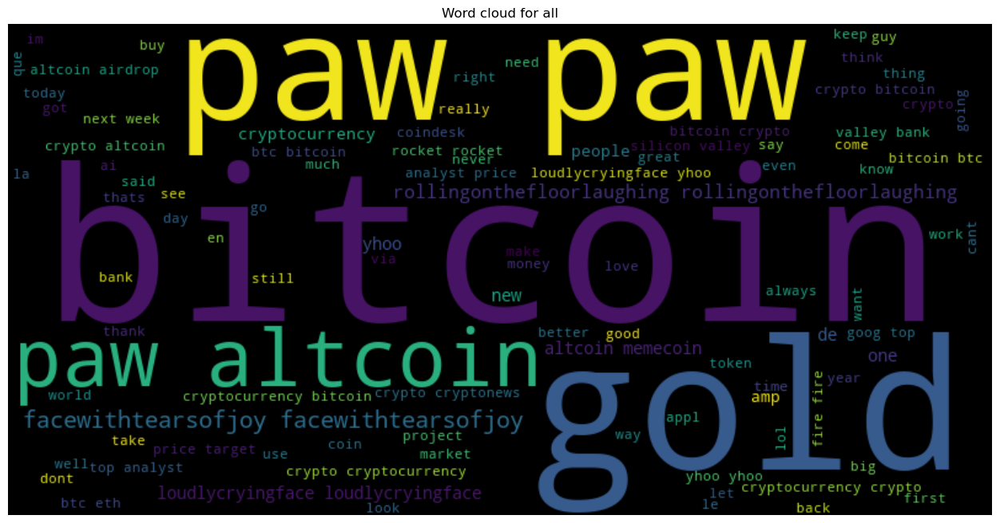

In [117]:
text = df['Cleaned Text']
text = ' '.join(text)
generate_wordcloud(text, 'all')

<div class="alert alert-block alert-success">
<b>Word Cloud </b> 
    
- We did a general overview of word cloud for the entire dataset regardless of one particular column.

</div>


##### 5.2 Wordclouds for different CSVs files

In [94]:
# Group the DataFrame by 'Source_File' and 'Date', and aggregate the 'Cleaned Text' values by joining them
df_grouped = df[['Source_File', 'Date', 'Cleaned Text']].groupby(by=['Source_File', 'Date']).agg(lambda x: ' '.join(x))


In [96]:
df_grouped.head()

Cleaned Text
Source_File Date                                                         
altcoin     2023-03-09  tax electricity used charge vibrator metis elo...
            2023-03-10  ethereum price update eth usd bitcoin btc foll...
appl        2023-03-05   option stock alert discord link apt jakk dynt...
            2023-03-06   bay cant wait caddy grinningfacewithbigeyes f...
            2023-03-07  happy birthday dd www sun job alert loudspeake...

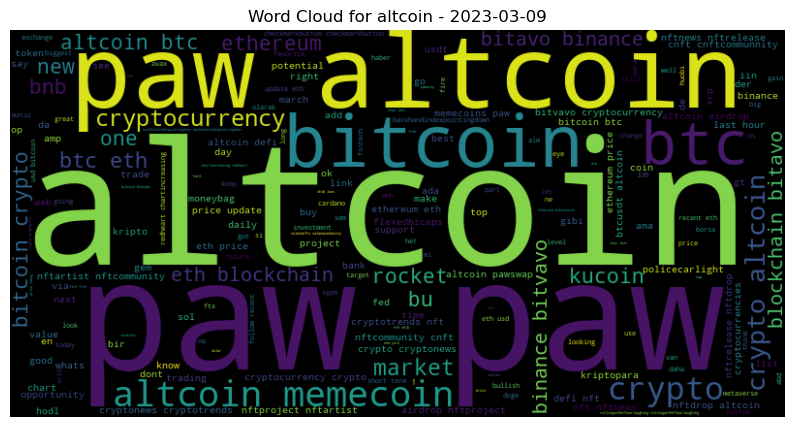

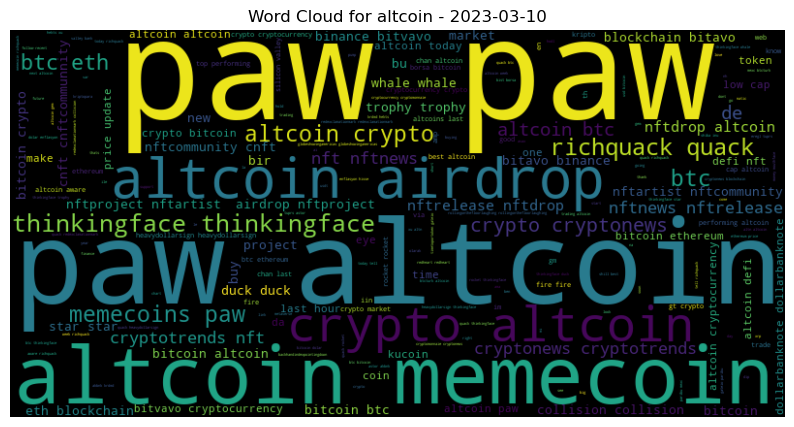

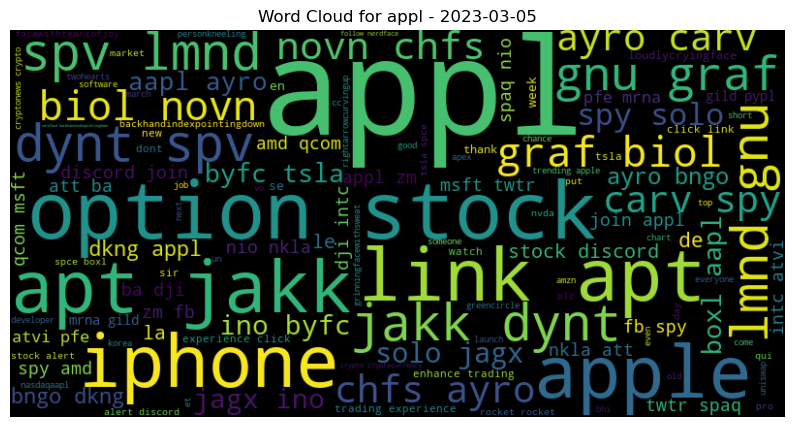

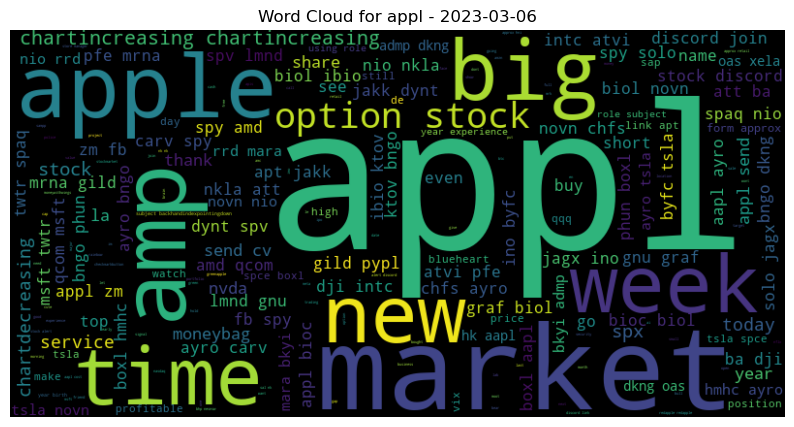

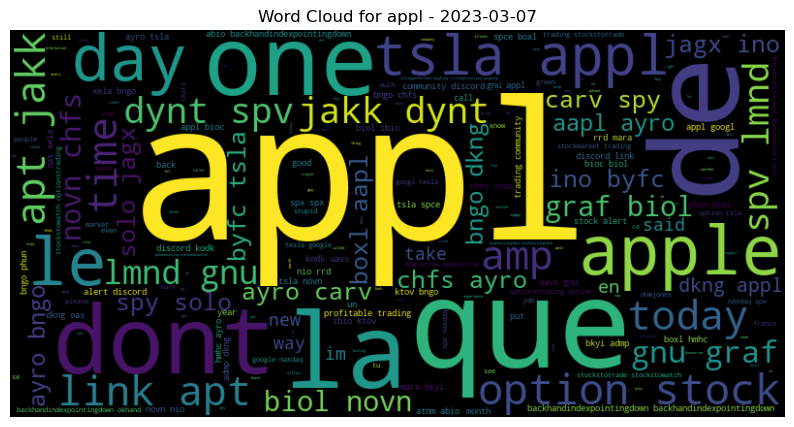

...

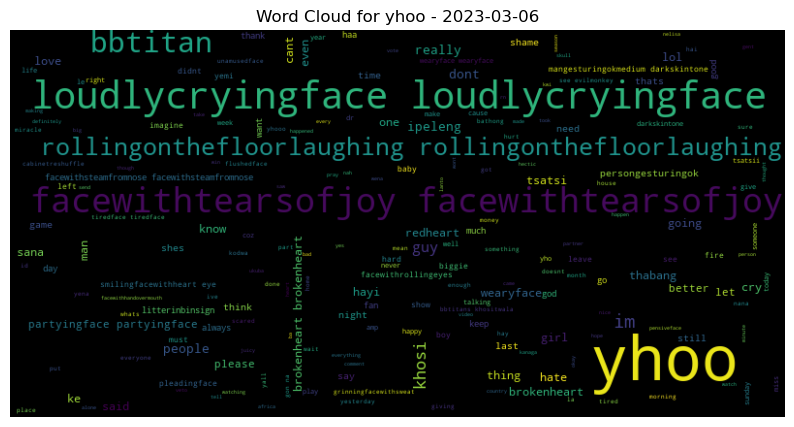

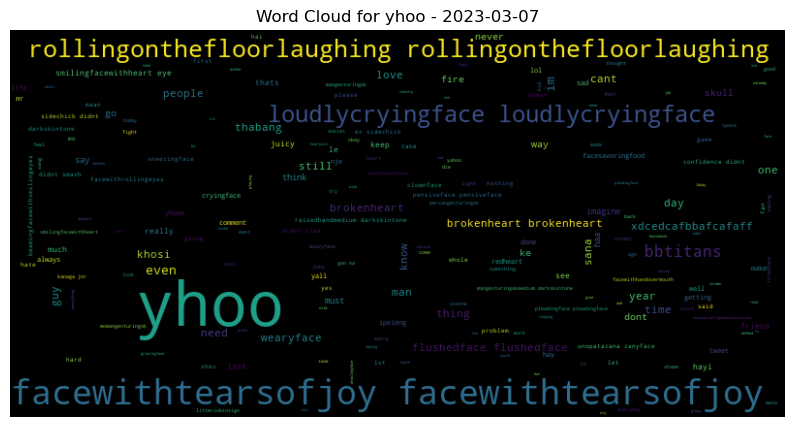

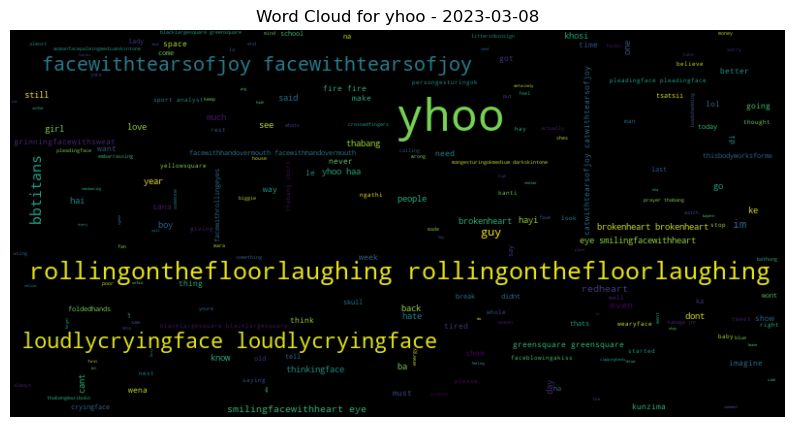

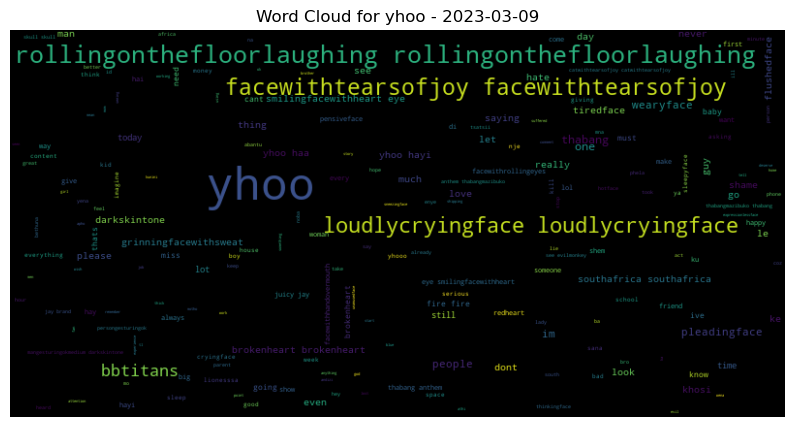

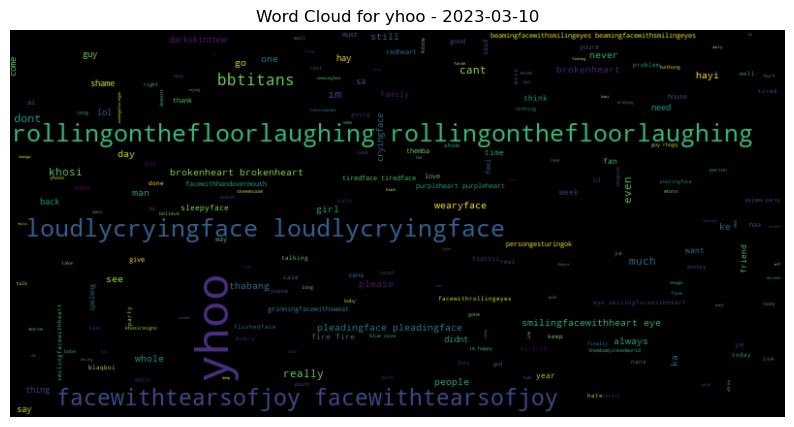

In [115]:
# Iterating over groups
for (source_file, date), group_df in df_grouped.groupby(level=['Source_File', 'Date']):
    # Concatenating the cleaned text within each group
    text_for_wordcloud = ' '.join(group_df['Cleaned Text'])
    
    # Generating WordClouds
    wordcloud = WordCloud(width=800, height=400, background_color='black').generate(text_for_wordcloud)
    
    # Plotting the WordClouds
    plt.figure(figsize=(10, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {source_file} - {date}')
    plt.axis('off')
    plt.show()`


<div class="alert alert-block alert-success">
<b>Word Cloud for differnt CSVs </b> 
    
- We customised the world cloud for differnt csvs based on the column source file
- It means that words that have most freuencey in that particular csv will be displayed along. 
- It also is important to note here that word cloud will be differnt for differnt csvs.

</div>


#### 5.3 Visualizing Date and Tweet id throughout different source file columns


In [84]:
#Filtering Date from datetime
df['Date'] = df['Datetime'].dt.date

In [86]:
#Grouping source file date and tweet id
df_grouped_count = df[['Source_File', 'Date', 'Tweet Id']].groupby(by = ['Source_File', 'Date'])[['Tweet Id']].count()
df_grouped_count.head()

Tweet Id
Source_File Date                
altcoin     2023-03-09       770
            2023-03-10      4231
appl        2023-03-05       205
            2023-03-06       273
            2023-03-07       594

<Axes: xlabel='Date', ylabel='Tweet Id'>

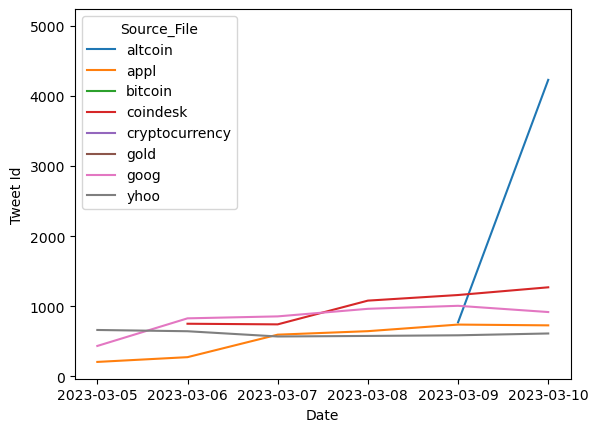

In [83]:
#Creating a lineplot for date and tweet id with source file as hue
sns.lineplot(data = df_grouped_count, x = 'Date', y = 'Tweet Id', hue = 'Source_File')

<div class="alert alert-block alert-success">
<b> Date vs Tweet id </b> 
    
- Here we are trying to visualize the how the tweets vary over the time period.
- We have plotted the tweets over time with source file as hue i. e differnt source files will have differnt plots of tweets vs date.
- We notice a sudden increase of tweets after 09th march 2023, which could be due to various reasons, such as any event or announcement , any social media trend, or maybe sometime bot activity.

</div>


####  5.4)Top 10  words based on TFIDF-scores across the cleaned _tweets

In [118]:
#calculating mean TFIDF score for each word
mean_tfidf=tdf.iloc[:,5:].mean()

In [119]:
top_words=mean_tfidf.nlargest(10)

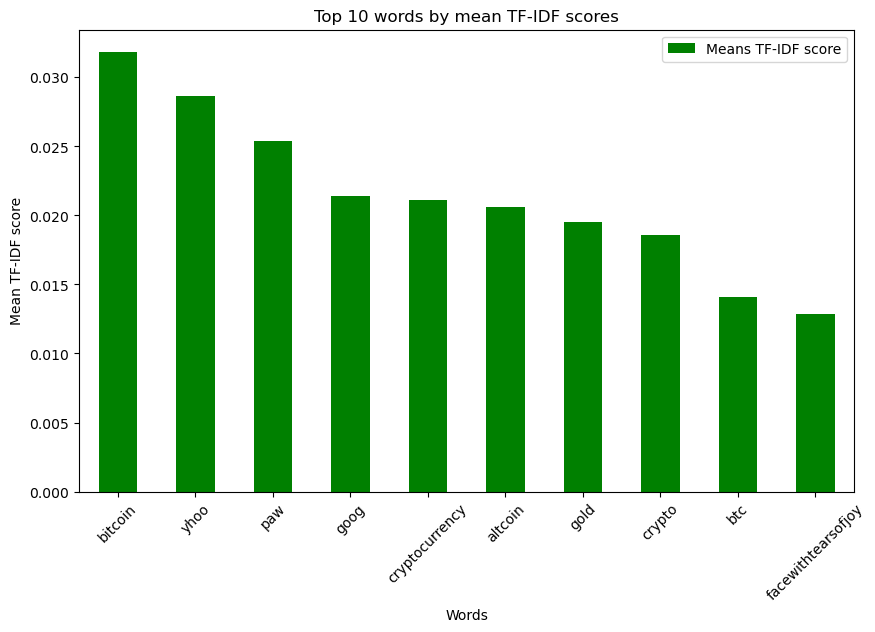

In [127]:
#creating a bar chart
plt.figure(figsize=(10,6))
top_words.plot(kind='bar',color='green')
plt.title('Top 10 words by mean TF-IDF scores')
plt.xlabel('Words')
plt.ylabel('Mean TF-IDF score')
plt.xticks(rotation=45)
plt.legend(['Means TF-IDF score'])
plt.show()

<div class="alert alert-block alert-success">
<b> Observations on the Words vs Mean TF-IDF scores Graph< b>
    
- Here we find out that yhoo, bitcoin, paw , goog are one the top 4 words given by TFIDF, alongwith their mean scores .
    
</div>

#### 5.) Distribution of Tweet Lengths

In [130]:
# Calculating the length of each tweet and adding a new column 'Tweet Length'
df['Tweet Length'] = df['Cleaned Text'].apply(len)


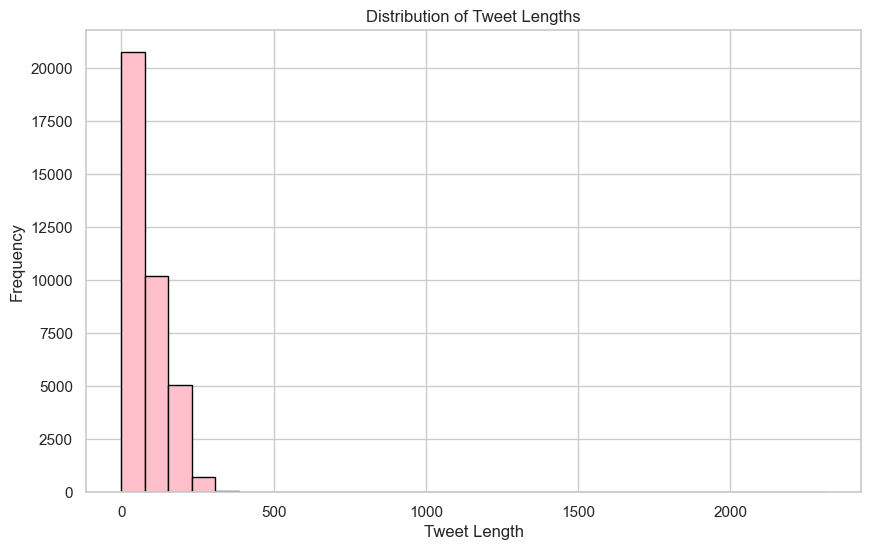

In [137]:
# Calculating the length of each tweet
df['Tweet Length'] = df['Cleaned Text'].apply(len)

# Plot the distribution of tweet lengths
plt.figure(figsize=(10, 6))
plt.hist(df['Tweet Length'], bins=30, color='pink', edgecolor='black')
plt.title('Distribution of Tweet Lengths')
plt.xlabel('Tweet Length')
plt.ylabel('Frequency')
plt.show()

<div class="alert alert-block alert-success">
<b> Tweet Length </b> 
    
- The above visualization helps us understand the variance in the length of our tweets across the dataset.

</div>

##### 5.5) Tweet count by Source file

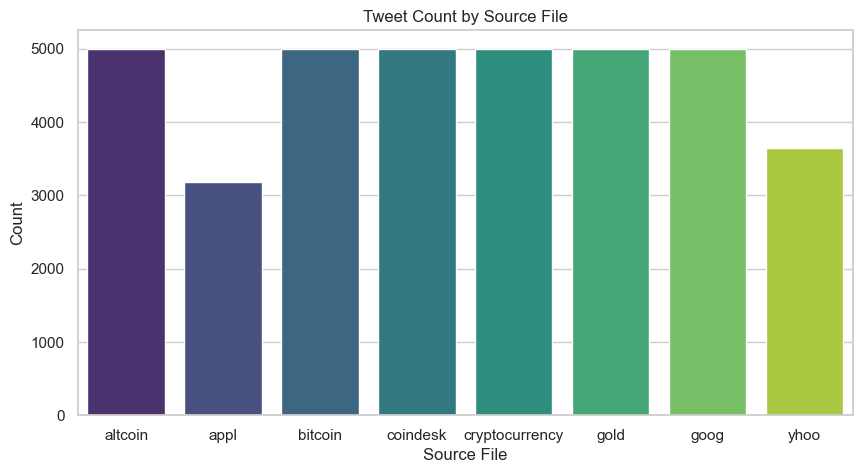

In [140]:
# Count plot for source file
plt.figure(figsize=(10, 5))
sns.countplot(x='Source_File', data=df, palette='viridis')
plt.title('Tweet Count by Source File')
plt.xlabel('Source File')
plt.ylabel('Count')
plt.show()


<div class="alert alert-block alert-success">
<b> Tweet Length </b> 
    
- The count plot for the source files provides insights into the distribution of tweets across various sources. Each bar in the plot represents a source file, and the height of the bar corresponds to the count of tweets originating from that source.
- We notice that Appl Source file has the least number of tweets after yhoo

</div>

##### 5.6 Box plot for tweet length by source file

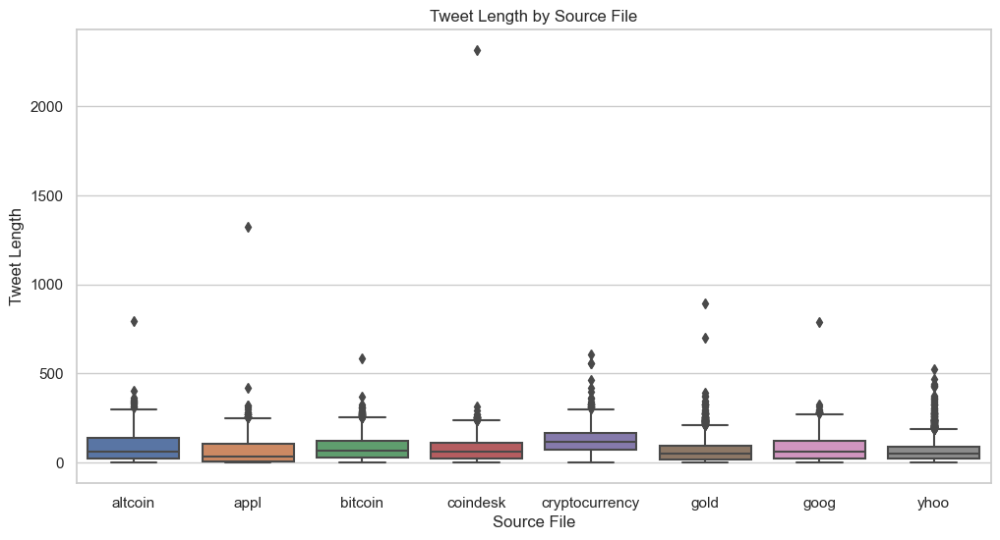

In [141]:
# Box plot for tweet length by source file
plt.figure(figsize=(12, 6))
sns.boxplot(x='Source_File', y='Tweet Length', data=df)
plt.title('Tweet Length by Source File')
plt.xlabel('Source File')
plt.ylabel('Tweet Length')
plt.show()


<div class="alert alert-block alert-success">
<b> Tweet Length  by source file </b> 
    
- The box plot for tweet length by source file provides insights into the distribution of tweet lengths originating from various sources. Each box in the plot represents the interquartile range (IQR) of tweet lengths for a specific source file, and the whiskers indicate the overall spread of the data.
    
- As visible we do notice few outliers lying across the datasets
</div>

##### 5.7 Pie chart for tweet counts

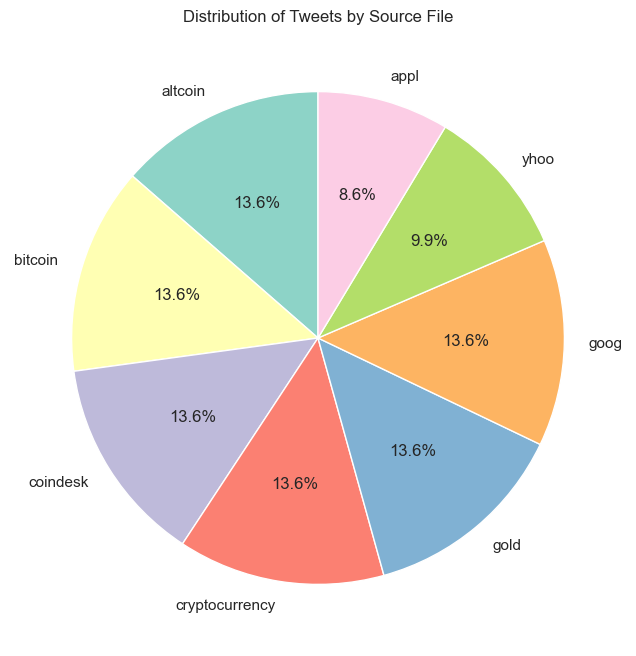

In [144]:
# Pie chart for tweet counts by source file
plt.figure(figsize=(8, 8))
source_file_counts = df['Source_File'].value_counts()
plt.pie(source_file_counts, labels=source_file_counts.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('Set3'))
plt.title('Distribution of Tweets by Source File')
plt.show()


<div class="alert alert-block alert-success">
<b> Distribution of tweets by source file </b> 
    
- The pie chart illustrates the distribution of tweets among various source files, providing a quick overview of the relative contribution of each source to the total tweet count.
- It further confirms that yhoo and appl have less tweet data as compared to their peers.

</div>

##### 5.8 Stacked bar chart for tweet counts

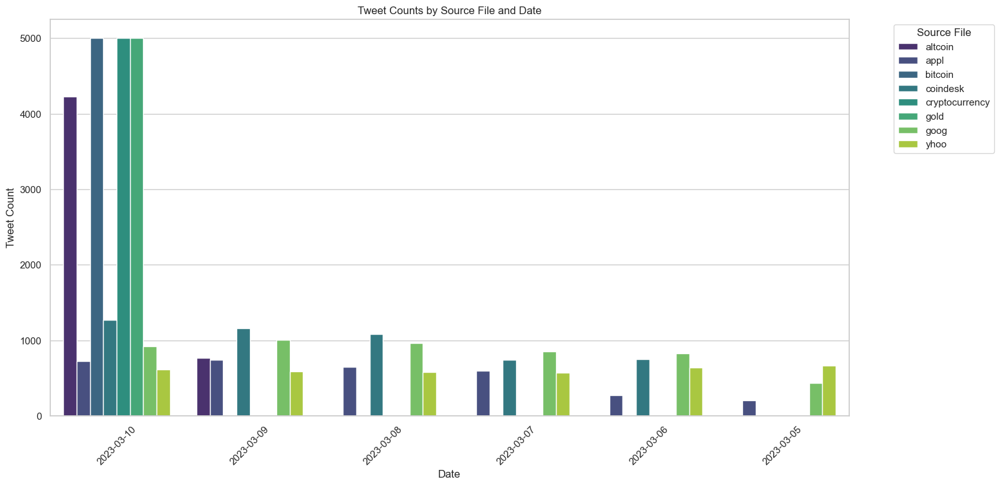

In [151]:
# Stacked bar chart for tweet counts by source file and date
plt.figure(figsize=(16, 8))
sns.countplot(x='Date', hue='Source_File', data=df, palette='viridis')
plt.title('Tweet Counts by Source File and Date')
plt.xlabel('Date')
plt.ylabel('Tweet Count')
plt.xticks(rotation=45)
plt.legend(title='Source File', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


<div class="alert alert-block alert-success">
<b> Tweet counts by source file and date </b> 
    
- The stacked bar chart illustrates how tweet counts vary over time for different source files. Each bar represents a specific date, and the different colors within each bar represent the contribution of each source file to the total tweet count on that date.
    
- We notice **higher engagement on 10th March 2023** as compared to rest on almost all the source files.
</div>
   

##### 5.8.1 Heatmap for tweet length by date

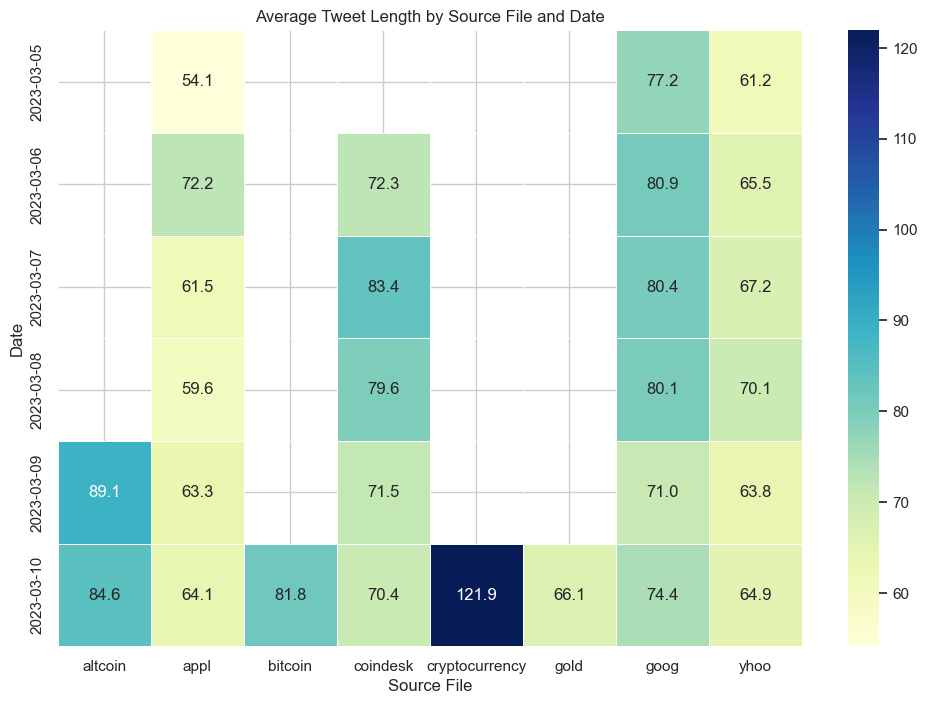

In [152]:
# Pivot the DataFrame for heatmap
heatmap_data = df.pivot_table(index='Date', columns='Source_File', values='Tweet Length', aggfunc='mean')

# Heatmap for tweet length by source file and date
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', annot=True, fmt='.1f', linewidths=.5)
plt.title('Average Tweet Length by Source File and Date')
plt.xlabel('Source File')
plt.ylabel('Date')
plt.show()


<div class="alert alert-block alert-success">
<b>  Heatmap for tweet length by source file and date </b> 
    
- The heatmap provides a visual representation of the average tweet length for each source file on different dates. Analyzing the heatmap can offer insights into how the average tweet length varies across sources and over time.
    
- We notice **cryptocurrency** as compared to rest has longer average length of tweets.
</div>

##### 5.8.2 Heatmap for tweet length by day of week

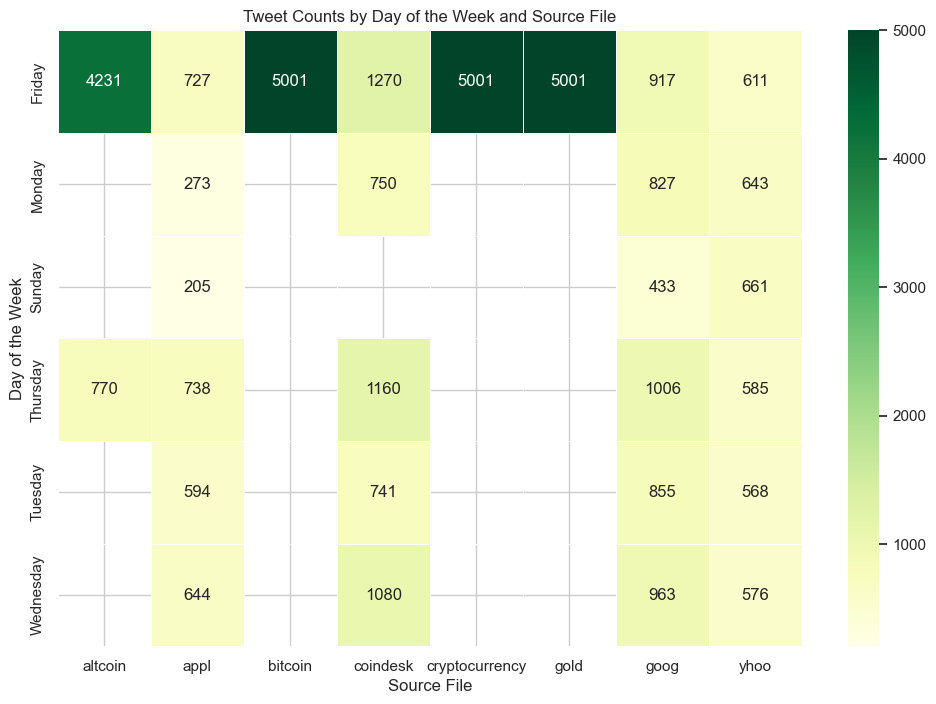

In [155]:
# Extract day of the week from datetime
df['Day_of_Week'] = df['Datetime'].dt.day_name()

# Pivot the DataFrame for heatmap
heatmap_data_day_of_week = df.pivot_table(index='Day_of_Week', columns='Source_File', values='Tweet Length', aggfunc='count')

# Heatmap for tweet counts by day of the week and source file
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data_day_of_week, cmap='YlGn', annot=True, fmt='g', linewidths=.5)
plt.title('Tweet Counts by Day of the Week and Source File')
plt.xlabel('Source File')
plt.ylabel('Day of the Week')
plt.show()


<div class="alert alert-block alert-success">
<b>  Heatmap for tweet length by source file and day of the week </b> 
    
- The heatmap illustrates the distribution of tweet counts across different source files on each day of the week. Analyzing this heatmap can provide insights into the tweeting behavior of various sources throughout the week
    
- We notice **Friday** seems to have more tweets than the rest of the week.
</div>

##### 5.9) Bar chart for daily number of tweets

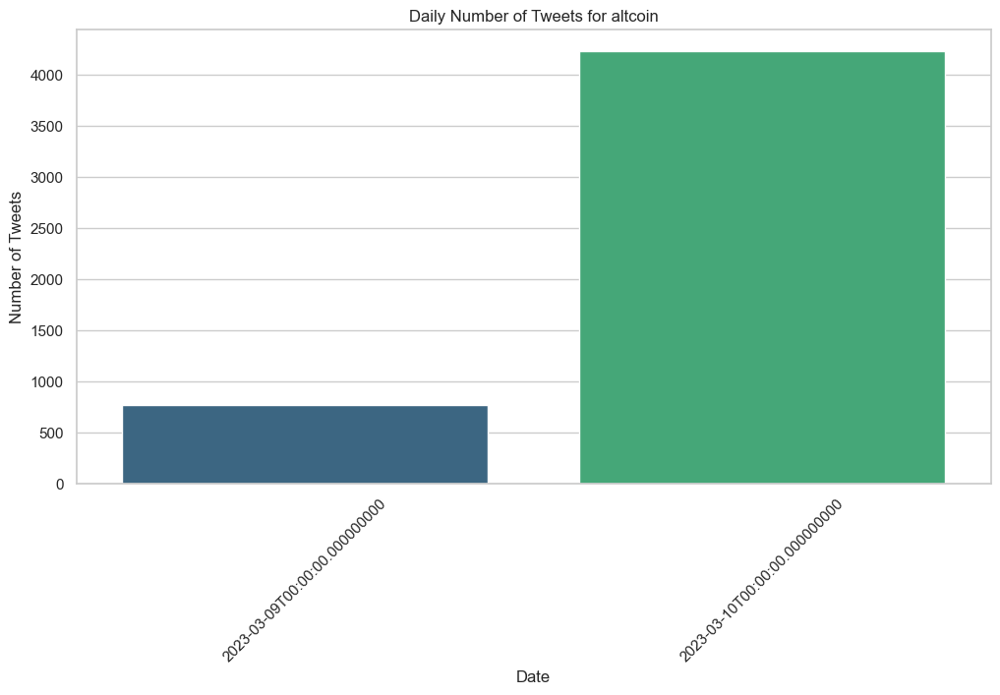

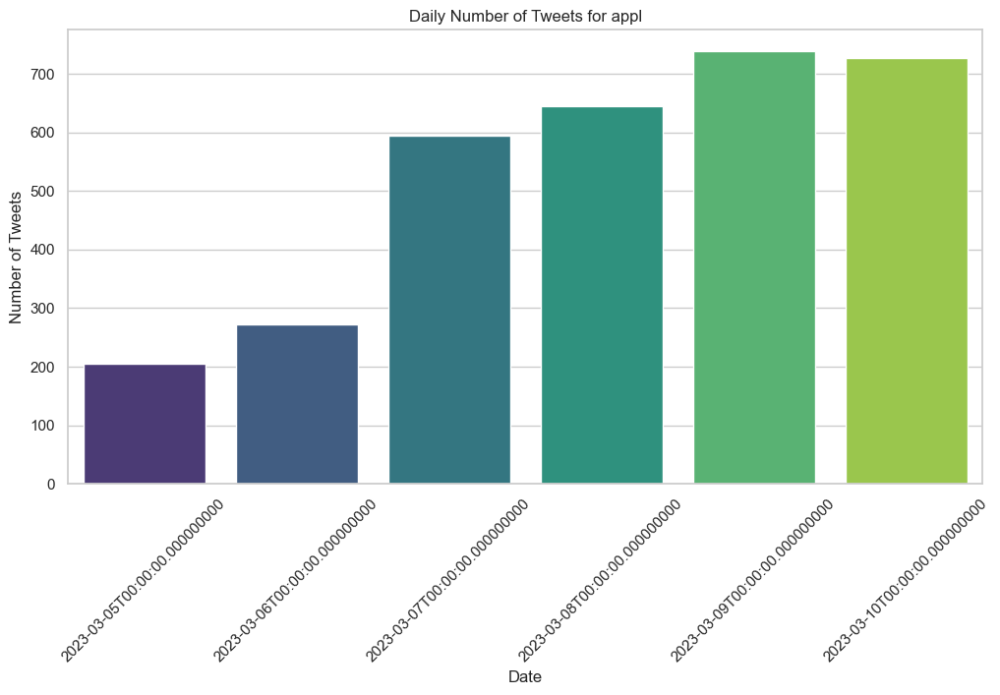

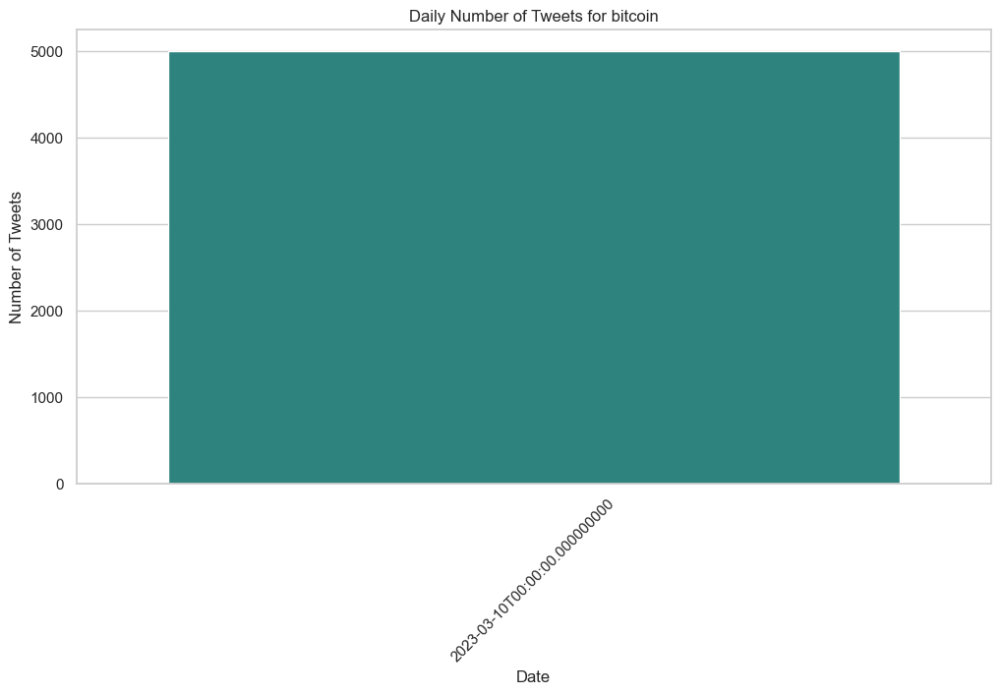

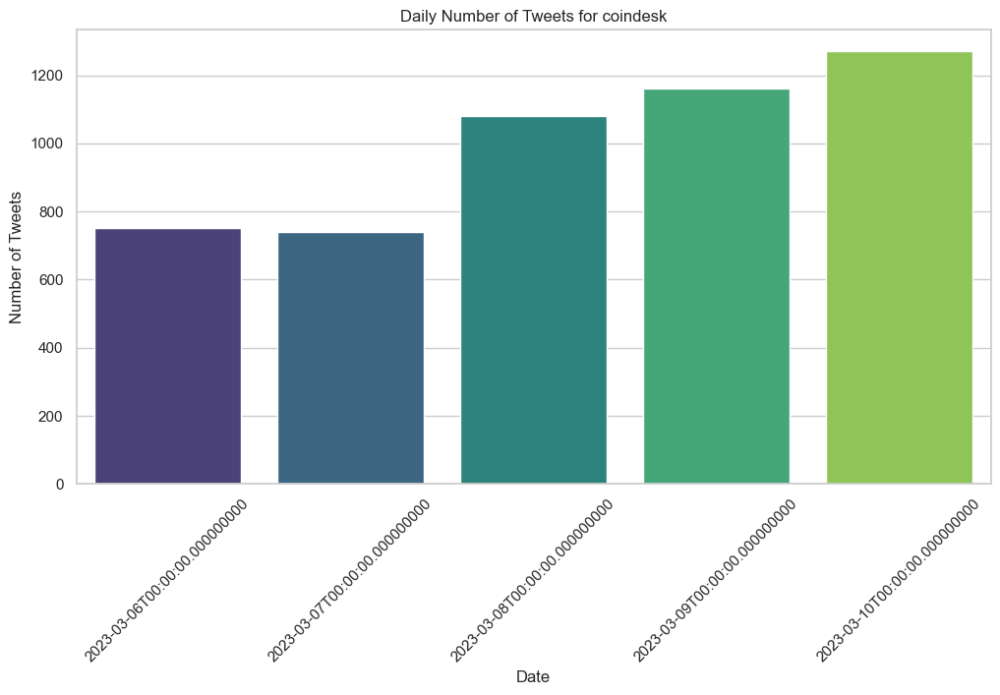

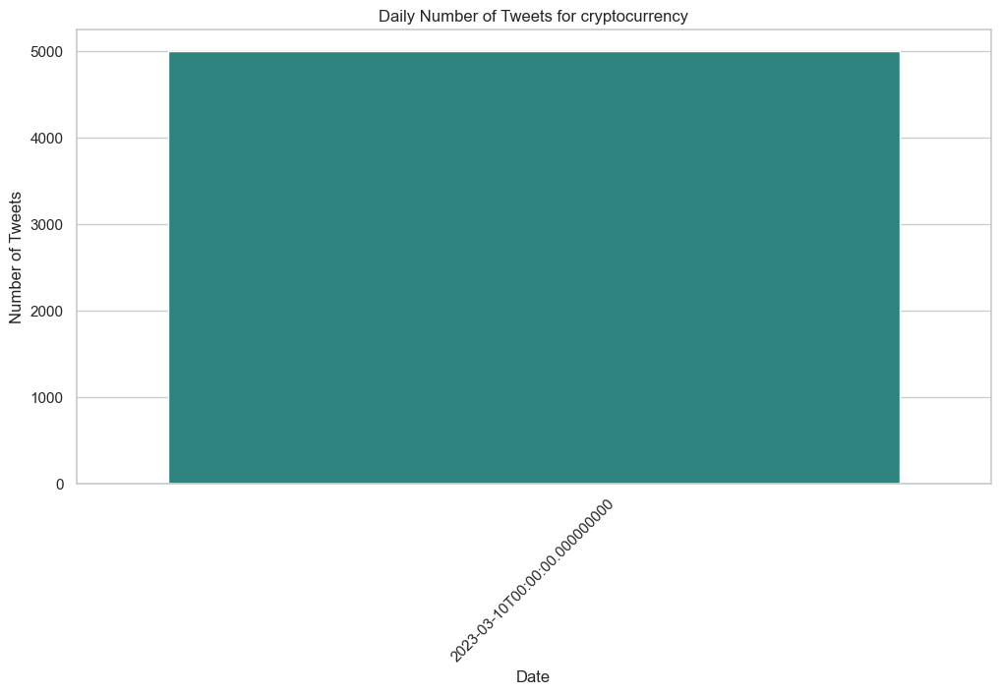

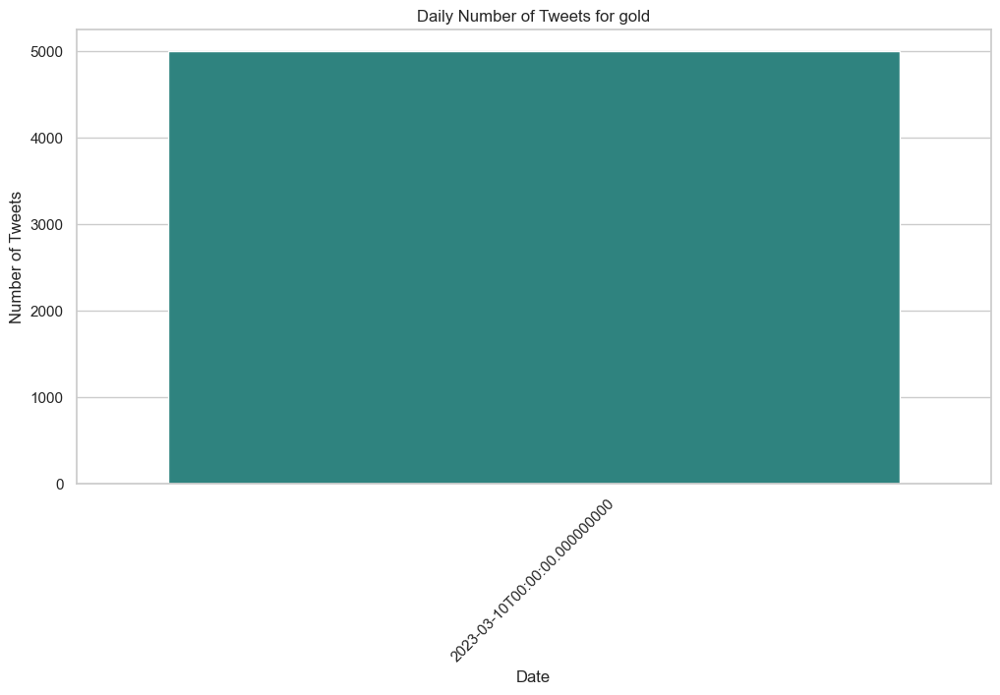

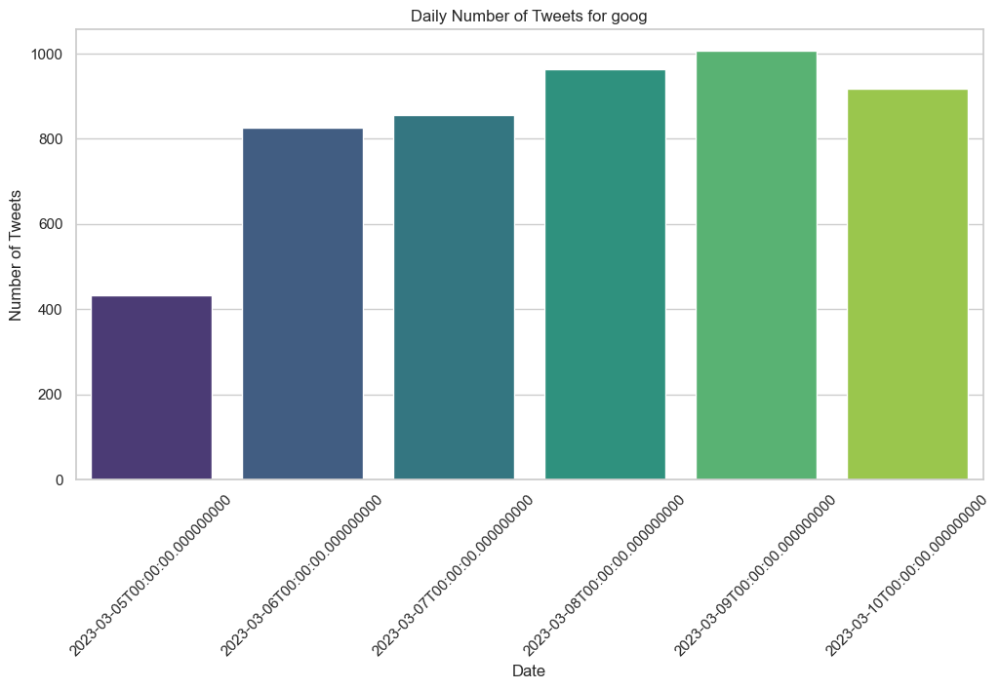

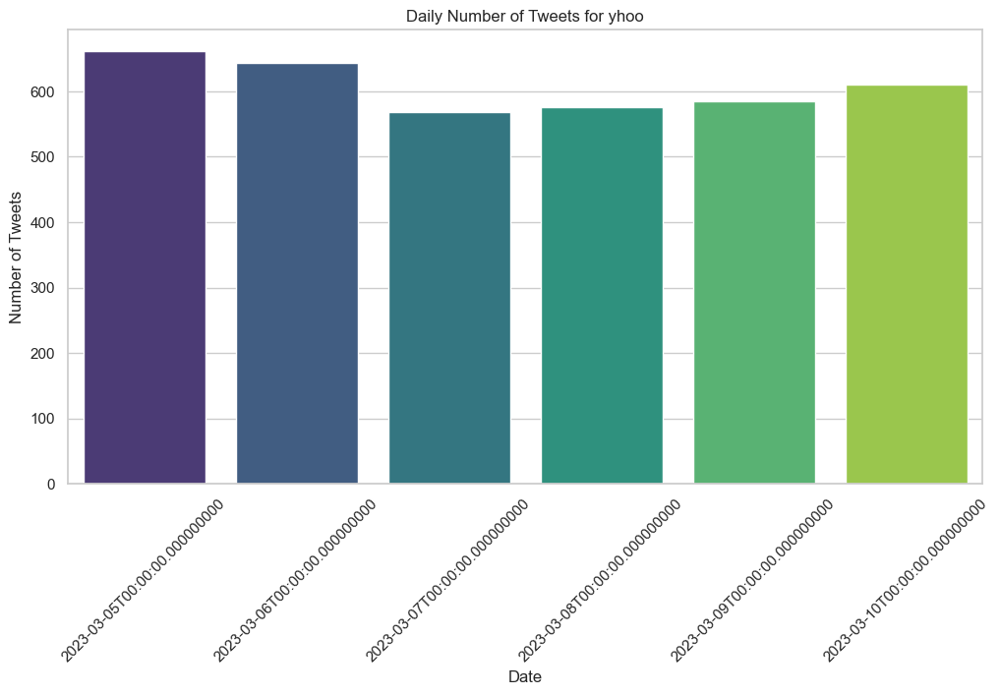

In [160]:
# Count the daily number of tweets and users for each keyword
daily_tweets_users = df.groupby(['Date', 'Source_File']).agg({'Tweet Id': 'count', 'User': 'nunique'}).reset_index()

# Create separate bar charts for each keyword
keywords = df['Source_File'].unique()

for keyword in keywords:
    keyword_data = daily_tweets_users[daily_tweets_users['Source_File'] == keyword]

    # Bar chart for the daily number of tweets
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Date', y='Tweet Id', data=keyword_data, palette='viridis')
    plt.title(f'Daily Number of Tweets for {keyword}')
    plt.xlabel('Date')
    plt.ylabel('Number of Tweets')
    plt.xticks(rotation=45)
    plt.show()




<div class="alert alert-block alert-success">
<b>  Daily number of tweets across all the Keywords </b> 
    
- For almost every keyword the tweets are higher on 10th march than the rest of the week.
- Appl and Yahoo seems to have the least number of tweets followed by goog and coindesk
    
</div>

##### 5.10 Bar chart for daily number of users across all source files

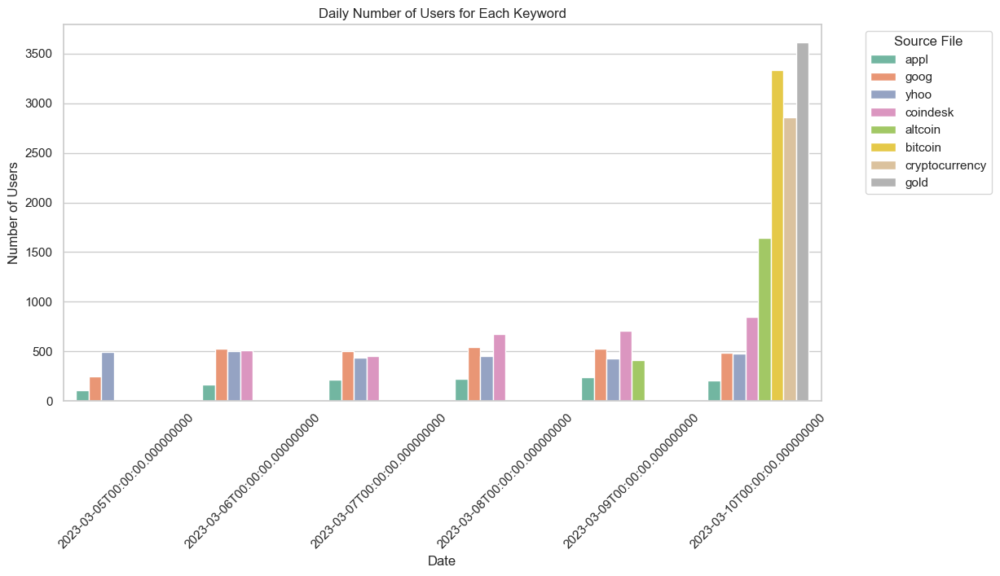

In [159]:
# Bar chart for the daily number of users for all source files
plt.figure(figsize=(12, 6))
sns.barplot(x='Date', y='User', hue='Source_File', data=daily_tweets_users, palette='Set2')
plt.title('Daily Number of Users for Each Keyword')
plt.xlabel('Date')
plt.ylabel('Number of Users')
plt.xticks(rotation=45)
plt.legend(title='Source File', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


<div class="alert alert-block alert-success">
<b>  Daily number of users across all source file </b> 
    
- Gold has the highest user engangement on 10th march 2023, followed by bitcoin and cryptocurrency
- Sudden increase in engagement on 10th march 2023
- appl has the least engagement ratio among all the rest of the source files.
    
</div>

##### 5.11 Sentiment Analysis

In [161]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [164]:
# Initializing the Sentiment Intensity Analyzer
sid = SentimentIntensityAnalyzer()
df['Sentiment'] = df['Cleaned Text'].apply(lambda x: sid.polarity_scores(x)['compound'])
# Mapping sentiment scores to categories (positive, neutral, negative)
df['Sentiment_Category'] = df['Sentiment'].apply(lambda x: 'Positive' if x > 0 else ('Neutral' if x == 0 else 'Negative'))

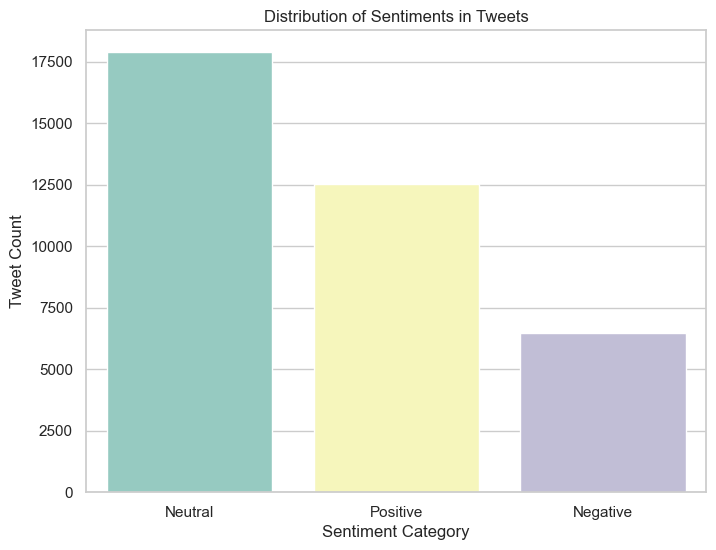

In [167]:
#Plotting the bargraph of sentiment 
plt.figure(figsize=(8, 6))
sns.countplot(x='Sentiment_Category', data=df, palette='Set3')
plt.title('Distribution of Sentiments in Tweets')
plt.xlabel('Sentiment Category')
plt.ylabel('Tweet Count')
plt.show()

<div class="alert alert-block alert-success">
<b>  Distribution of sentiments </b> 
    
- Most of the tweets seem to be neutral followed by positive.
- Around 6k tweets seem to be negative.
    
</div>

<div class="alert alert-block alert-success">
<b>CONCLUSION: </b> 

- From data we recieved we can conclude the following:
    
    
    - Engagement is highest on friday for all of the souce files.
    - Appl and yahoo were the least talked about comapnies/stocks throughout the week.
    - From those wordClouds plotted, we can see the different frequencies of top words across the dataset.
   - Most tweets were Neutral and positive

</div>